In [ ]:
# Run this for Google CoLab (use TensorFlow 1.x)
%tensorflow_version 1.x
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

TensorFlow 1.x selected.
Mounted at /content/drive


In [ ]:
!git clone https://github.com/NVlabs/stylegan2-ada.git

Cloning into 'stylegan2-ada'...
remote: Enumerating objects: 71, done.
remote: Total 71 (delta 0), reused 0 (delta 0), pack-reused 71
Unpacking objects: 100% (71/71), done.


In [ ]:
!ls /content/stylegan2-ada/

calc_metrics.py  Dockerfile   LICENSE.txt   README.md	     train.py
dataset_tool.py  docs	      metrics	    style_mixing.py
dnnlib		 generate.py  projector.py  training


In [ ]:
import sys
import pickle
import os
import numpy as np
import PIL.Image
from IPython.display import Image
import matplotlib.pyplot as plt

sys.path.insert(0, "/content/stylegan2-ada")

import dnnlib
import dnnlib.tflib as tflib

def seed2vec(Gs, seed):
  rnd = np.random.RandomState(seed)
  return rnd.randn(1, *Gs.input_shape[1:])

def init_random_state(Gs, seed):
  rnd = np.random.RandomState(seed) 
  noise_vars = [var for name, var in Gs.components.synthesis.vars.items() if name.startswith('noise')]
  tflib.set_vars({var: rnd.randn(*var.shape.as_list()) for var in noise_vars}) # [height, width]

def display_image(image):
  plt.axis('off')
  plt.imshow(image)
  plt.show()

def generate_image(Gs, z, truncation_psi):
    # Render images for dlatents initialized from random seeds.
    Gs_kwargs = {
        'output_transform': dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True),
        'randomize_noise': False
    }
    if truncation_psi is not None:
        Gs_kwargs['truncation_psi'] = truncation_psi

    label = np.zeros([1] + Gs.input_shapes[1][1:])
    images = Gs.run(z, label, **Gs_kwargs) # [minibatch, height, width, channel]
    return images[0]

In [ ]:
import IPython.display

#URL = "https://github.com/jeffheaton/pretrained-gan-fish/releases/download/1.0.0/fish-gan-2020-12-09.pkl"
#URL = "https://github.com/jeffheaton/pretrained-merry-gan-mas/releases/download/v1/christmas-gan-2020-12-03.pkl"
URL = "https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada/pretrained/ffhq.pkl"
tflib.init_tf()
print('Loading networks from "%s"...' % URL)
with dnnlib.util.open_url(URL) as fp:
    _G, _D, Gs = pickle.load(fp)

Loading networks from "https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada/pretrained/ffhq.pkl"...


Seed 1000
Setting up TensorFlow plugin "fused_bias_act.cu": Compiling... Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Compiling... Loading... Done.


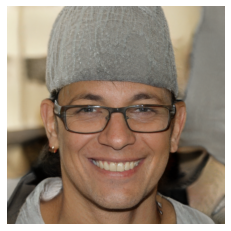

Seed 1001


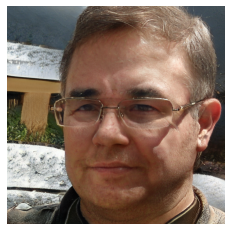

Seed 1002


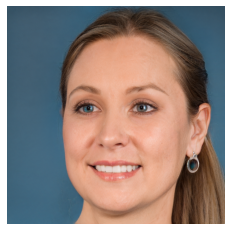

In [ ]:
# Choose your own starting and ending seed.
SEED_FROM = 1000
SEED_TO = 1003

# Generate the images for the seeds.
for i in range(SEED_FROM, SEED_TO):
  print(f"Seed {i}")
  init_random_state(Gs, 10)
  z = seed2vec(Gs, i)
  img = generate_image(Gs, z, 1.0)
  display_image(img)

In [ ]:
import argparse

import PIL.Image

import re
from io import BytesIO
import IPython.display

from math import ceil
from PIL import Image, ImageDraw
import imageio

noise_vars = [var for name, var in Gs.components.synthesis.vars.items() if name.startswith('noise')]

# Generates a list of images, based on a list of latent vectors (Z), and a list (or a single constant) of truncation_psi's.
def generate_images_in_w_space(dlatents, truncation_psi):
    Gs_kwargs = dnnlib.EasyDict()
    Gs_kwargs.output_transform = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)
    Gs_kwargs.randomize_noise = False
    Gs_kwargs.truncation_psi = truncation_psi
    dlatent_avg = Gs.get_var('dlatent_avg') # [component]

    imgs = []
    for row, dlatent in log_progress(enumerate(dlatents), name = "Generating images"):
        #row_dlatents = (dlatent[np.newaxis] - dlatent_avg) * np.reshape(truncation_psi, [-1, 1, 1]) + dlatent_avg
        dl = (dlatent-dlatent_avg)*truncation_psi   + dlatent_avg
        row_images = Gs.components.synthesis.run(dlatent,  **Gs_kwargs)
        imgs.append(PIL.Image.fromarray(row_images[0], 'RGB'))
    return imgs       

def generate_images_in_z_space(zs, truncation_psi):
    Gs_kwargs = dnnlib.EasyDict()
    Gs_kwargs.output_transform = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)
    Gs_kwargs.randomize_noise = False
    if not isinstance(truncation_psi, list):
        truncation_psi = [truncation_psi] * len(zs)
        
    imgs = []
    for z_idx, z in log_progress(enumerate(zs), size = len(zs), name = "Generating images"):
        Gs_kwargs.truncation_psi = truncation_psi[z_idx]
        noise_rnd = np.random.RandomState(1) # fix noise
        tflib.set_vars({var: noise_rnd.randn(*var.shape.as_list()) for var in noise_vars}) # [height, width]
        images = Gs.run(z, None, **Gs_kwargs) # [minibatch, height, width, channel]
        imgs.append(PIL.Image.fromarray(images[0], 'RGB'))
    return imgs

def generate_zs_from_seeds(seeds):
    zs = []
    for seed_idx, seed in enumerate(seeds):
        rnd = np.random.RandomState(seed)
        z = rnd.randn(1, *Gs.input_shape[1:]) # [minibatch, component]
        zs.append(z)
    return zs

# Generates a list of images, based on a list of seed for latent vectors (Z), and a list (or a single constant) of truncation_psi's.
def generate_images_from_seeds(seeds, truncation_psi):
    return generate_images_in_z_space(generate_zs_from_seeds(seeds), truncation_psi)

def saveImgs(imgs, location):
  for idx, img in log_progress(enumerate(imgs), size = len(imgs), name="Saving images"):
    file = location+ str(idx) + ".png"
    img.save(file)

def imshow(a, format='png', jpeg_fallback=True):
  a = np.asarray(a, dtype=np.uint8)
  str_file = BytesIO()
  PIL.Image.fromarray(a).save(str_file, format)
  im_data = str_file.getvalue()
  try:
    disp = IPython.display.display(IPython.display.Image(im_data))
  except IOError:
    if jpeg_fallback and format != 'jpeg':
      print ('Warning: image was too large to display in format "{}"; '
             'trying jpeg instead.').format(format)
      return imshow(a, format='jpeg')
    else:
      raise
  return disp

def showarray(a, fmt='png'):
    a = np.uint8(a)
    f = StringIO()
    PIL.Image.fromarray(a).save(f, fmt)
    IPython.display.display(IPython.display.Image(data=f.getvalue()))

        
def clamp(x, minimum, maximum):
    return max(minimum, min(x, maximum))
    
def drawLatent(image,latents,x,y,x2,y2, color=(255,0,0,100)):
  buffer = PIL.Image.new('RGBA', image.size, (0,0,0,0))
   
  draw = ImageDraw.Draw(buffer)
  cy = (y+y2)/2
  draw.rectangle([x,y,x2,y2],fill=(255,255,255,180), outline=(0,0,0,180))
  for i in range(len(latents)):
    mx = x + (x2-x)*(float(i)/len(latents))
    h = (y2-y)*latents[i]*0.1
    h = clamp(h,cy-y2,y2-cy)
    draw.line((mx,cy,mx,cy+h),fill=color)
  return PIL.Image.alpha_composite(image,buffer)
             
  
def createImageGrid(images, scale=0.25, rows=1):
   w,h = images[0].size
   w = int(w*scale)
   h = int(h*scale)
   height = rows*h
   cols = ceil(len(images) / rows)
   width = cols*w
   canvas = PIL.Image.new('RGBA', (width,height), 'white')
   for i,img in enumerate(images):
     img = img.resize((w,h), PIL.Image.ANTIALIAS)
     canvas.paste(img, (w*(i % cols), h*(i // cols))) 
   return canvas

def convertZtoW(latent, truncation_psi=0.7, truncation_cutoff=9):
  dlatent = Gs.components.mapping.run(latent, None) # [seed, layer, component]
  dlatent_avg = Gs.get_var('dlatent_avg') # [component]
  for i in range(truncation_cutoff):
    dlatent[0][i] = (dlatent[0][i]-dlatent_avg)*truncation_psi + dlatent_avg
    
  return dlatent

def interpolate(zs, steps):
   out = []
   for i in range(len(zs)-1):
    for index in range(steps):
     fraction = index/float(steps) 
     out.append(zs[i+1]*fraction + zs[i]*(1-fraction))
   return out

# Taken from https://github.com/alexanderkuk/log-progress
def log_progress(sequence, every=1, size=None, name='Items'):
    from ipywidgets import IntProgress, HTML, VBox
    from IPython.display import display

    is_iterator = False
    if size is None:
        try:
            size = len(sequence)
        except TypeError:
            is_iterator = True
    if size is not None:
        if every is None:
            if size <= 200:
                every = 1
            else:
                every = int(size / 200)     # every 0.5%
    else:
        assert every is not None, 'sequence is iterator, set every'

    if is_iterator:
        progress = IntProgress(min=0, max=1, value=1)
        progress.bar_style = 'info'
    else:
        progress = IntProgress(min=0, max=size, value=0)
    label = HTML()
    box = VBox(children=[label, progress])
    display(box)

    index = 0
    try:
        for index, record in enumerate(sequence, 1):
            if index == 1 or index % every == 0:
                if is_iterator:
                    label.value = '{name}: {index} / ?'.format(
                        name=name,
                        index=index
                    )
                else:
                    progress.value = index
                    label.value = u'{name}: {index} / {size}'.format(
                        name=name,
                        index=index,
                        size=size
                    )
            yield record
    except:
        progress.bar_style = 'danger'
        raise
    else:
        progress.bar_style = 'success'
        progress.value = index
        label.value = "{name}: {index}".format(
            name=name,
            index=str(index or '?')
        )


# Interpolation on Z space

[569 753 379 990 708 549 138  43 998]


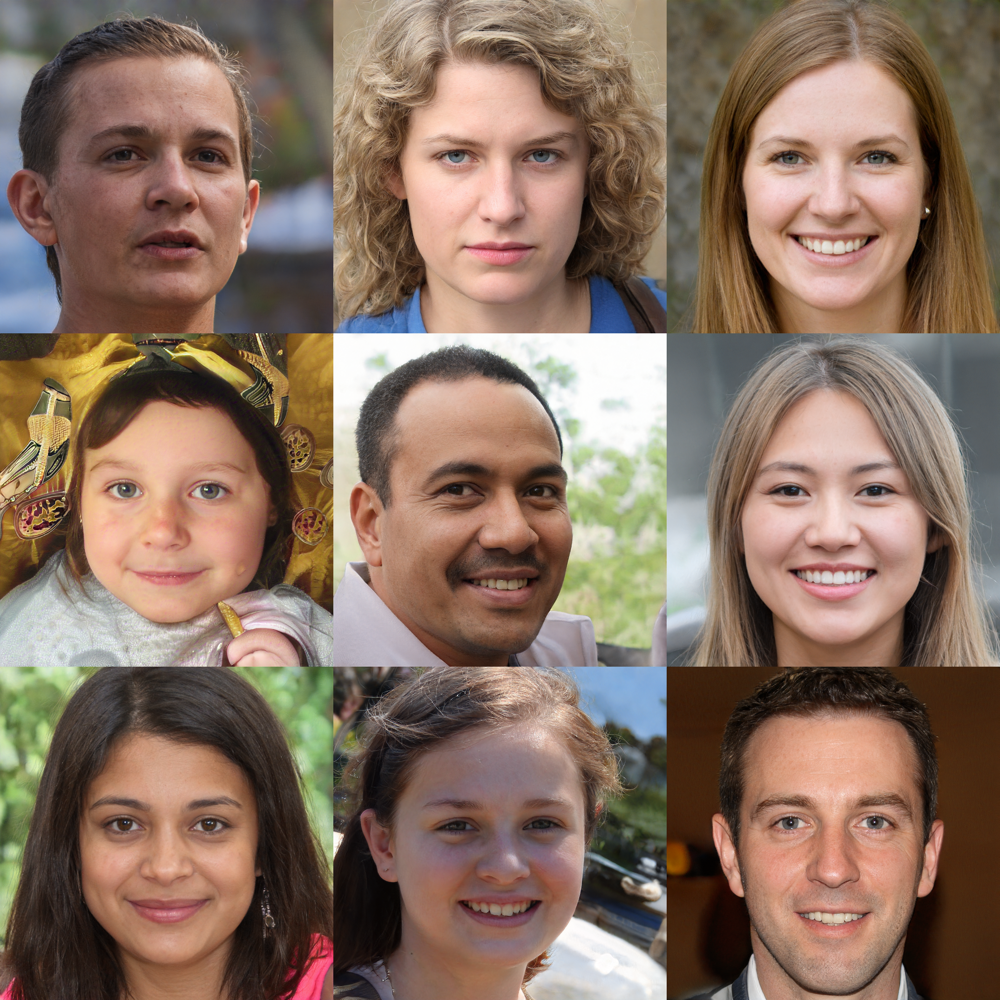

In [ ]:
seeds = np.random.randint(1000, size=9)
print(seeds)

# show the seeds
imshow(createImageGrid(generate_images_from_seeds(seeds, 0.7), 0.7 , 3))

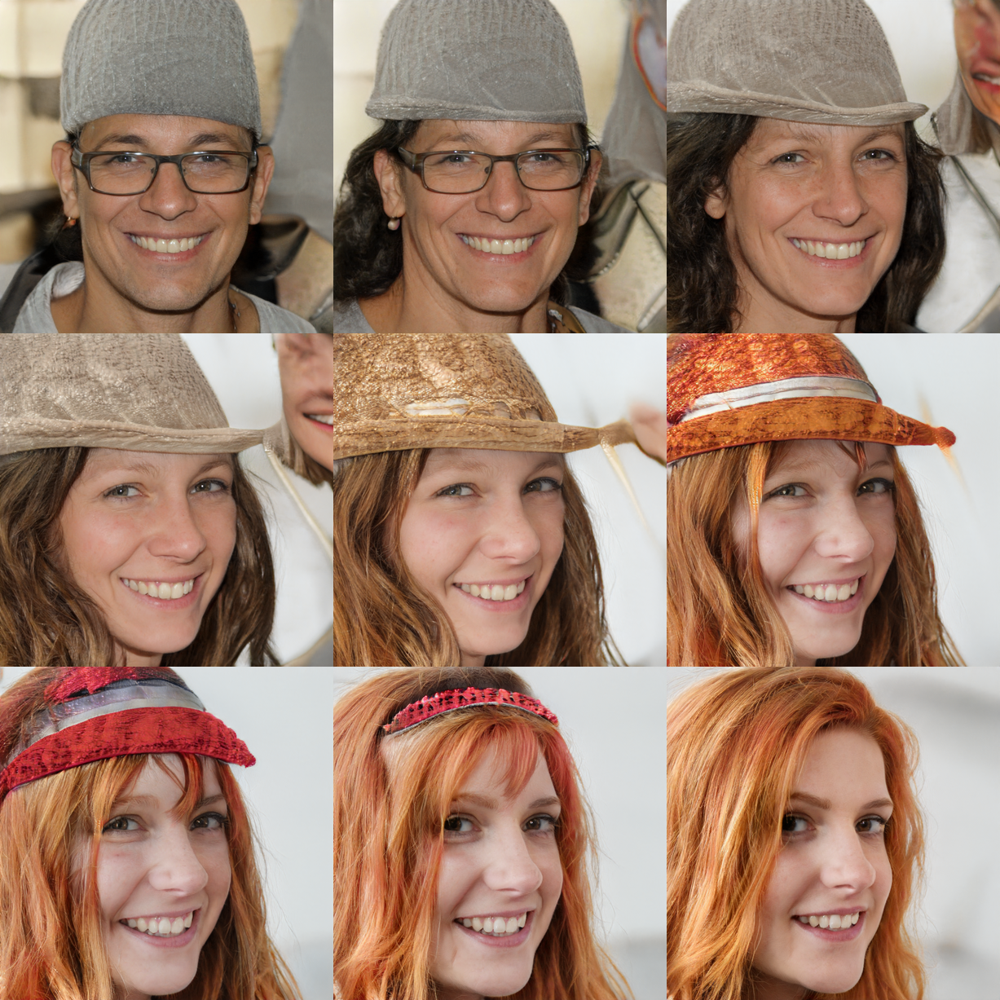

In [ ]:
zs = generate_zs_from_seeds([1000 , 1003])

latent1 = zs[0]
latent2 = zs[1]
number_of_steps = 9
imgs = generate_images_in_z_space(interpolate([latent1,latent2],number_of_steps), 1.0)
number_of_images = len(imgs)
imshow(createImageGrid(imgs, 0.4 , 3))

In [ ]:
zs = generate_zs_from_seeds([1000,1001,1002,1003 ,2000,2001,2002])

number_of_steps = 10
imgs = generate_images_in_z_space(interpolate(zs,number_of_steps), 1.0)

# Example of reading a generated set of images, and storing as MP4.
%mkdir out
movieName = 'out/mov.mp4'

with imageio.get_writer(movieName, mode='I') as writer:
    for image in log_progress(list(imgs), name = "Creating animation"):
        writer.append_data(np.array(image))

In [ ]:
# In order to download files, you can use the snippet below - this often fails for me, though, so I prefer the 'Files' browser in the sidepanel.

from google.colab import files
files.download(movieName) 


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Interpolation on W

In [ ]:
zs = generate_zs_from_seeds([1000 , 1003])
dls = []
for z in zs:
  dls.append(convertZtoW(z ,truncation_psi=1.0))
number_of_steps = 9
imgs = generate_images_in_w_space(interpolate(dls,number_of_steps), 1.0)
number_of_images = len(imgs)
imshow(createImageGrid(imgs, 0.4 , 3))

In [ ]:
# more complex example, interpolating in W instead of Z space.
zs = generate_zs_from_seeds([421645,6149575,3487643,3766864 ,3857159,5360657,3720613 ])

# It seems my truncation_psi is slightly less efficient in W space - I probably introduced an error somewhere...

dls = []
for z in zs:
  dls.append(convertZtoW(z ,truncation_psi=1.0))

number_of_steps = 100

imgs = generate_images_in_w_space(interpolate(dls,number_of_steps), 1.0)

%mkdir out
movieName = 'out/mov2.mp4'

with imageio.get_writer(movieName, mode='I') as writer:
    for image in log_progress(list(imgs), name = "Creating animation"):
        writer.append_data(np.array(image))

mkdir: cannot create directory ‘out’: File exists


In [ ]:
# In order to download files, you can use the snippet below - this often fails for me, though, so I prefer the 'Files' browser in the sidepanel.

from google.colab import files
files.download(movieName)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Latent direction for stylegan2

In [ ]:
!git clone https://github.com/a312863063/generators-with-stylegan2.git

Cloning into 'generators-with-stylegan2'...
remote: Enumerating objects: 32, done.
remote: Counting objects: 100% (32/32), done.
remote: Compressing objects: 100% (32/32), done.
remote: Total 638 (delta 19), reused 0 (delta 0), pack-reused 606
Receiving objects: 100% (638/638), 27.37 MiB | 28.95 MiB/s, done.
Resolving deltas: 100% (331/331), done.


In [ ]:
# Loading already learned latent directions
import numpy as np

smile_direction = np.load('generators-with-stylegan2/latent_directions/smile.npy')
gender_direction = np.load('generators-with-stylegan2/latent_directions/gender.npy')
age_direction = np.load('generators-with-stylegan2/latent_directions/age.npy')

beauty_direction = np.load('generators-with-stylegan2/latent_directions/beauty.npy')
emotion_happy_direction = np.load('generators-with-stylegan2/latent_directions/emotion_happy.npy')
emotion_sad_direction = np.load('generators-with-stylegan2/latent_directions/emotion_sad.npy')


race_black_direction = np.load('generators-with-stylegan2/latent_directions/race_black.npy')
race_white_direction = np.load('generators-with-stylegan2/latent_directions/race_white.npy')
race_yellow_direction = np.load('generators-with-stylegan2/latent_directions/race_yellow.npy')

glasses_direction = np.load('generators-with-stylegan2/latent_directions/glasses.npy')

In [ ]:
def generate_image_latents(Gs,dlatents):
  assert dlatents.shape[1:] == (18, 512) # [N, 18, 512]
  imgs = Gs.components.synthesis.run(dlatents, output_transform=dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True))
  return imgs
def move_and_show(latent_vector, direction, coeffs):
    fig,ax = plt.subplots(1, len(coeffs), figsize=(15, 10), dpi=80)
    for i, coeff in enumerate(coeffs):
        new_latent_vector = latent_vector.copy()
        new_latent_vector[:8] = (latent_vector + coeff*direction)[:8]
        new_latent_vector = new_latent_vector[np.newaxis,:,:]
        imgs = generate_image_latents(Gs,new_latent_vector)
        ax[i].imshow(imgs[0])
        ax[i].set_title('Coeff: %0.1f' % coeff)
    [x.axis('off') for x in ax]
    plt.show()

In [ ]:
z = seed2vec(Gs, 1002)
img = generate_image(Gs, z, 1.0)
display_image(img)

NameError: ignored

In [ ]:
w= convertZtoW(z)
w.shape

(1, 18, 512)

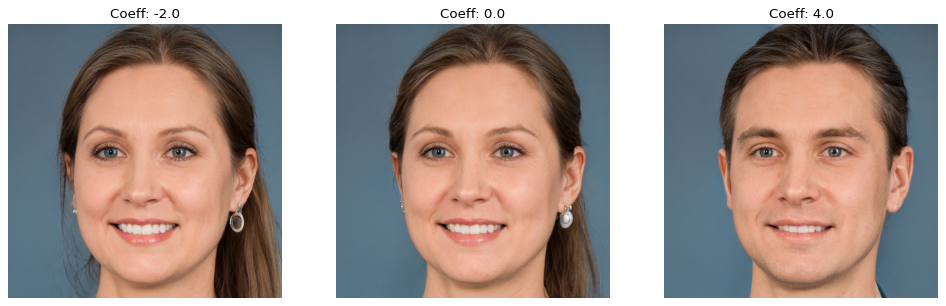

In [ ]:
move_and_show(w[0],gender_direction,[-2,0,4])

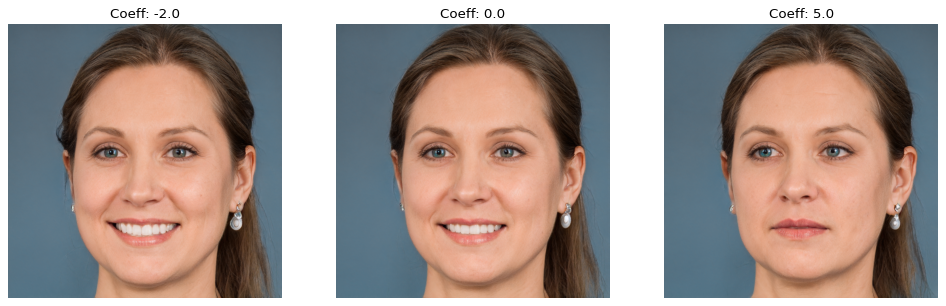

In [ ]:
move_and_show(w[0],emotion_sad_direction,[-2,0,5])

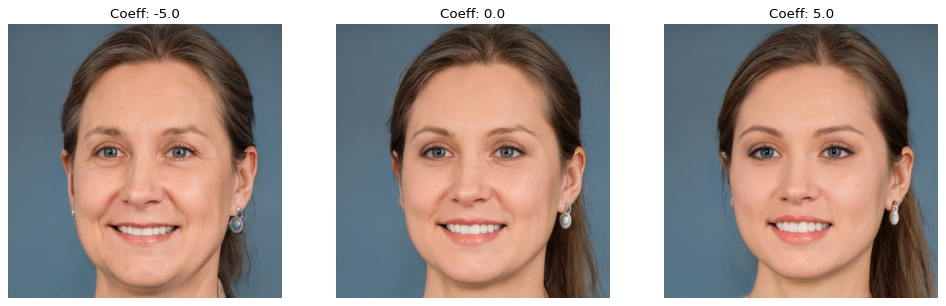

In [ ]:
move_and_show(w[0],age_direction,[-5,0,5])

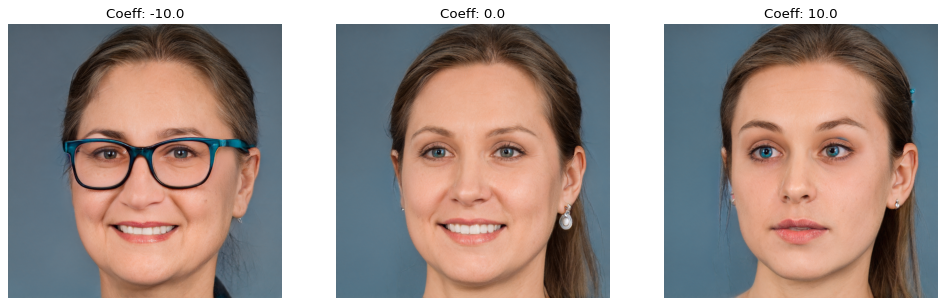

In [ ]:
move_and_show(w[0],glasses_direction,[-10,0,10])

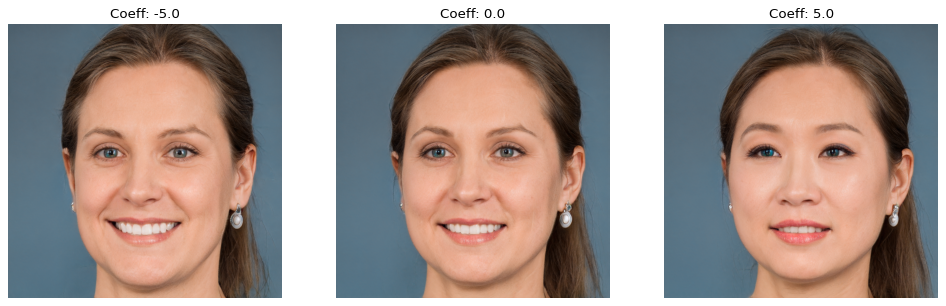

In [ ]:
move_and_show(w[0],race_yellow_direction,[-5,0,5])

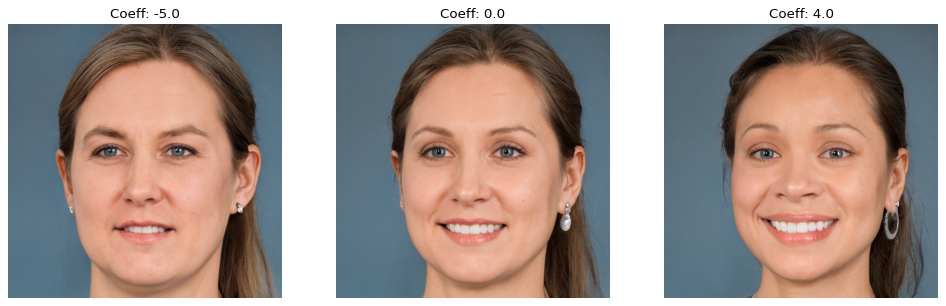

In [ ]:
move_and_show(w[0],race_black_direction,[-5,0,4])

# Projecting images onto the generatable manifold
StyleGAN2 comes with a projector that finds the closest generatable image based on any input image. This allows you to get a feeling for the diversity of the portrait manifold.